In [1]:
import os
import sys
module_path = os.path.abspath(os.path.join('..'))
if module_path not in sys.path:
    sys.path.append(module_path)

In [2]:
import networkit as nk
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import time
import umap
import phate

from External.WS_Tree_dist import EMD_dist_tree_discretized, EMD_dist_tree_edge, plot_flow_discretized
from External.ICT.calculate_ICT import calculate_ICT, compute_widths
from External.clustering import k_means_pp
from External.generation import create_graph

from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from IPython.display import display, Math, Latex, Markdown
from tqdm.notebook import tqdm

from numpy.linalg import norm

plt.style.use('standard.mplstyle')

# Hyperparameters
mode = "K_Nearest+Density2"
metric = "euclidean"

In [3]:
def patch_together_nearest(G, position):
    list_of_all_nodes = np.array(range(G.numberOfNodes()))
    
    cc = nk.components.ConnectedComponents(G)
    cc.run()
    components = cc.getComponents()
    number_of_components = cc.numberOfComponents()
    
    bridges = 1
    
    while number_of_components != 1:

            

        compA = np.array(components[0])
        compB = np.delete(list_of_all_nodes, compA)


        pointsA = position[compA]
        pointsB = position[compB]
        
        diff = pairwise_distances(pointsA, pointsB, n_jobs=-1)

        top_bridges = np.argpartition(diff.flatten(), bridges)[0:bridges]
        indices = np.unravel_index(top_bridges, diff.shape)
        nodesA = compA[indices[0]]
        nodesB = compB[indices[1]]

        for i in range(bridges):
            try:
                nodeA = nodesA[i]
                nodeB = nodesB[i]
            except:
                print(nodesA, nodesB, indices, top_bridges, compA, compB)
                raise RuntimeError("Bug somewhere")
            distance = norm(position[nodeA] - position[nodeB])
            if not G.hasEdge(nodeA, nodeB):
                G.addEdge(nodeA, nodeB, distance)

                    
        cc = nk.components.ConnectedComponents(G)
        cc.run()
        components = cc.getComponents()
        number_of_components = cc.numberOfComponents()
        
    return G

In [4]:
PC_to_CC = np.load("../../Data/eth_CC/PC_to_CC.npy")
CA_to_CC = np.load("../../Data/eth_CC/CA_to_CC.npy")

labels = pd.read_csv("~/Data/eth_reduced/obs.csv",header=0)[PC_to_CC]
position = pd.read_csv("~/Data/eth_reduced/X_chronic.csv",header=None)[PC_to_CC]


position = position.to_numpy()
unique_labels = list(labels["annot"].unique())
labels = labels["annot"].to_numpy()

number_of_nodes = len(position)

position.shape

(13707, 4999)

In [5]:
pos = StandardScaler().fit_transform(position)
pca = PCA(n_components=100).fit_transform(pos)

# calculate the cluster centers and the components
ε, δ = 0.03, 0.1
r = 1 / (ε**2) * (int(np.log2(number_of_nodes - 1)) + 1 + np.log(1/δ))
k = int(np.sqrt(r))
k = np.min((k, number_of_nodes))
cluster_centers, labels = k_means_pp(k, position, metric=metric, return_labels=True)
unique_labels = np.unique(labels)

sklearn is done: 336.50583958625793
My own part is done: 70.35112261772156


In [6]:
components = []
for label in unique_labels:
    component = np.argwhere(label == labels).T
    assert len(component) == 1
    components.append(component[0])

sub_ICTs = []
for component in tqdm(components):
    
    sub_number_of_nodes = len(component)
    
    # Only one node -> no graph possible
    if sub_number_of_nodes == 1:
        sub_G = nk.graph.Graph(n=1, weighted=True)
    
    # TODO: might not be the best solution
    elif sub_number_of_nodes <= 6:
        sub_G, _ = create_graph(sub_number_of_nodes, mode, position=pca[component], k=1,
                                beta=2, delta=0.5, bridges=1)
        sub_G.indexEdges()
        
    else:
        sub_G, _ = create_graph(sub_number_of_nodes, mode, position=pca[component], k=4,
                                beta=2, delta=0.5, bridges=4)
        sub_G.indexEdges()

    sub_ICT = calculate_ICT(sub_G, algorithm_type="exact_own",
                                   zeros_stay_zeros=True, update_G=1.1)
    sub_ICT.indexEdges()
    sub_ICTs.append(sub_ICT)

update Arr 65 -> 54
update Arr 54 -> 49
update Arr 49 -> 39
update Arr 39 -> 34
update Arr 34 -> 30
update Arr 30 -> 29
update Arr 29 -> 28
update Arr 28 -> 25
update Arr 25 -> 24
update Arr 24 -> 23
update Arr 23 -> 19
added 2 edges early



update Arr 18 -> 15
update Arr 15 -> 12
update Arr 12 -> 9
update Arr 9 -> 7
update Arr 7 -> 6



update Arr 744 -> 671
added 6 edges early
update Arr 671 -> 604
update Arr 604 -> 549
added 3 edges early
update Arr 549 -> 499
added 4 edges early
update Arr 499 -> 453
update Arr 453 -> 410
update Arr 410 -> 370
update Arr 370 -> 335
update Arr 335 -> 303
update Arr 303 -> 272
update Arr 272 -> 247
update Arr 247 -> 225
update Arr 225 -> 223
update Arr 223 -> 221
update Arr 221 -> 216
added 2 edges early
update Arr 216 -> 216
update Arr 216 -> 215



update Arr 1792 -> 1621
added 19 edges early
update Arr 1621 -> 1469
added 4 edges early
update Arr 1469 -> 1330
added 2 edges early
update Arr 1330 -> 1207
added 2 edges early
update Arr 1207 -> 1089
added 10 edges early
update Arr 1089 -> 989
update Arr 989 -> 899
update Arr 899 -> 813
update Arr 813 -> 739
update Arr 739 -> 670
update Arr 670 -> 609
update Arr 609 -> 553
update Arr 553 -> 502
update Arr 502 -> 487
update Arr 487 -> 486
update Arr 486 -> 484
update Arr 484 -> 481
update Arr 481 -> 480
update Arr 480 -> 479
update Arr 479 -> 479
update Arr 479 -> 478



update Arr 45 -> 39
update Arr 39 -> 31
update Arr 31 -> 24
update Arr 24 -> 23
update Arr 23 -> 21
update Arr 21 -> 19
update Arr 19 -> 15
update Arr 15 -> 14
update Arr 14 -> 13



update Arr 32 -> 29
update Arr 29 -> 24
update Arr 24 -> 20
update Arr 20 -> 18
update Arr 18 -> 16
update Arr 16 -> 14
update Arr 14 -> 12
update Arr 12 -> 11



update Arr 38 -> 34
update Arr 34 -> 30
update Arr 30 -> 26
update Arr 26 -> 18
update Arr 18 -> 15
update Arr 15 -> 14
update Arr 14 -> 13
update Arr 13 -> 13



update Arr 17 -> 13
update Arr 13 -> 12
update Arr 12 -> 10
update Arr 10 -> 9
update Arr 9 -> 6



update Arr 188 -> 162
added 2 edges early
update Arr 162 -> 144
update Arr 144 -> 124
added 2 edges early
update Arr 124 -> 111
update Arr 111 -> 99
update Arr 99 -> 86
update Arr 86 -> 77
update Arr 77 -> 68
update Arr 68 -> 61
update Arr 61 -> 60
update Arr 60 -> 58
update Arr 58 -> 54
update Arr 54 -> 54
update Arr 54 -> 53



update Arr 84 -> 72
update Arr 72 -> 64
update Arr 64 -> 56
update Arr 56 -> 49
update Arr 49 -> 43
update Arr 43 -> 35
update Arr 35 -> 32
update Arr 32 -> 32
update Arr 32 -> 29
update Arr 29 -> 28
update Arr 28 -> 27



update Arr 3006 -> 2729
added 23 edges early
update Arr 2729 -> 2473
added 4 edges early
update Arr 2473 -> 2242
added 7 edges early
update Arr 2242 -> 2037
added 10 edges early
update Arr 2037 -> 1847
added 20 edges early
update Arr 1847 -> 1671
added 12 edges early
update Arr 1671 -> 1519
update Arr 1519 -> 1379
update Arr 1379 -> 1253
update Arr 1253 -> 1139
update Arr 1139 -> 1035
added 3 edges early
update Arr 1035 -> 939
update Arr 939 -> 853
update Arr 853 -> 846
update Arr 846 -> 845
update Arr 845 -> 844
update Arr 844 -> 844
update Arr 844 -> 838
added 2 edges early
update Arr 838 -> 838
update Arr 838 -> 837
update Arr 837 -> 836



update Arr 3340 -> 3031
added 24 edges early
update Arr 3031 -> 2752
added 9 edges early
update Arr 2752 -> 2501
added 11 edges early
update Arr 2501 -> 2258
added 15 edges early
update Arr 2258 -> 2050
added 23 edges early
update Arr 2050 -> 1858
added 22 edges early
update Arr 1858 -> 1689
update Arr 1689 -> 1535
update Arr 1535 -> 1395
update Arr 1395 -> 1268
update Arr 1268 -> 1152
update Arr 1152 -> 1047
update Arr 1047 -> 951
update Arr 951 -> 949
update Arr 949 -> 946
added 2 edges early
update Arr 946 -> 946
update Arr 946 -> 942
update Arr 942 -> 942
update Arr 942 -> 941
update Arr 941 -> 940
update Arr 940 -> 939



update Arr 18 -> 15
update Arr 15 -> 15
update Arr 15 -> 12
update Arr 12 -> 10
update Arr 10 -> 9
update Arr 9 -> 7



update Arr 1 -> 1



update Arr 3 -> 3
added 2 edges early



update Arr 1 -> 1



update Arr 5 -> 5
added 3 edges early



update Arr 1 -> 1



update Arr 1 -> 1



update Arr 21 -> 18
update Arr 18 -> 14
update Arr 14 -> 12
update Arr 12 -> 9
update Arr 9 -> 8
update Arr 8 -> 8



update Arr 5673 -> 5143
added 33 edges early
update Arr 5143 -> 4672
added 7 edges early
update Arr 4672 -> 4245
added 14 edges early
update Arr 4245 -> 3859
added 21 edges early
update Arr 3859 -> 3501
added 32 edges early
update Arr 3501 -> 3182
update Arr 3182 -> 2891
update Arr 2891 -> 2628
update Arr 2628 -> 2389
update Arr 2389 -> 2171
update Arr 2171 -> 1973
update Arr 1973 -> 1793
update Arr 1793 -> 1629
update Arr 1629 -> 1496
update Arr 1496 -> 1488
added 5 edges early
update Arr 1488 -> 1488
update Arr 1488 -> 1487
update Arr 1487 -> 1487



update Arr 1904 -> 1715
added 18 edges early
update Arr 1715 -> 1558
added 4 edges early
update Arr 1558 -> 1412
added 5 edges early
update Arr 1412 -> 1283
added 5 edges early
update Arr 1283 -> 1150
added 5 edges early
update Arr 1150 -> 1045
update Arr 1045 -> 949
update Arr 949 -> 862
update Arr 862 -> 783
update Arr 783 -> 711
update Arr 711 -> 646
update Arr 646 -> 585
update Arr 585 -> 531
update Arr 531 -> 528
update Arr 528 -> 528
update Arr 528 -> 522
added 3 edges early
update Arr 522 -> 522
update Arr 522 -> 521



update Arr 2 -> 2



update Arr 26 -> 22
update Arr 22 -> 16
update Arr 16 -> 14
update Arr 14 -> 13
update Arr 13 -> 12
update Arr 12 -> 12



update Arr 2 -> 2



update Arr 3 -> 3
added 2 edges early



update Arr 30 -> 27
update Arr 27 -> 23
update Arr 23 -> 16
update Arr 16 -> 14
update Arr 14 -> 12
update Arr 12 -> 10
update Arr 10 -> 9



update Arr 18 -> 15
update Arr 15 -> 12
update Arr 12 -> 10
update Arr 10 -> 8
update Arr 8 -> 7



update Arr 2 -> 2



update Arr 28 -> 23
update Arr 23 -> 16
update Arr 16 -> 13
update Arr 13 -> 12
update Arr 12 -> 11
update Arr 11 -> 10



update Arr 18 -> 15
update Arr 15 -> 12
update Arr 12 -> 10
update Arr 10 -> 10
update Arr 10 -> 8



update Arr 2684 -> 2439
added 14 edges early
update Arr 2439 -> 2206
added 11 edges early
update Arr 2206 -> 2004
added 10 edges early
update Arr 2004 -> 1819
added 11 edges early
update Arr 1819 -> 1650
added 12 edges early
update Arr 1650 -> 1498
update Arr 1498 -> 1361
update Arr 1361 -> 1236
update Arr 1236 -> 1120
update Arr 1120 -> 1018
update Arr 1018 -> 925
update Arr 925 -> 840
update Arr 840 -> 764
update Arr 764 -> 763
update Arr 763 -> 756
added 6 edges early
update Arr 756 -> 756



update Arr 25 -> 22
update Arr 22 -> 18
update Arr 18 -> 15
update Arr 15 -> 13
update Arr 13 -> 11
update Arr 11 -> 10



update Arr 4744 -> 4312
added 33 edges early
update Arr 4312 -> 3905
added 10 edges early
update Arr 3905 -> 3548
added 10 edges early
update Arr 3548 -> 3219
added 23 edges early
update Arr 3219 -> 2923
added 25 edges early
update Arr 2923 -> 2657
update Arr 2657 -> 2415
update Arr 2415 -> 2195
update Arr 2195 -> 1993
update Arr 1993 -> 1810
update Arr 1810 -> 1644
update Arr 1644 -> 1494
update Arr 1494 -> 1356
update Arr 1356 -> 1273
update Arr 1273 -> 1272
update Arr 1272 -> 1270
update Arr 1270 -> 1269
update Arr 1269 -> 1264
added 4 edges early
update Arr 1264 -> 1264



update Arr 2 -> 2



update Arr 1 -> 1



update Arr 2 -> 2



update Arr 1 -> 1



update Arr 1 -> 1



update Arr 2 -> 2



update Arr 1 -> 1



update Arr 5533 -> 5022
added 50 edges early
update Arr 5022 -> 4554
added 14 edges early
update Arr 4554 -> 4138
added 11 edges early
update Arr 4138 -> 3758
added 17 edges early
update Arr 3758 -> 3415
added 18 edges early
update Arr 3415 -> 3104
update Arr 3104 -> 2821
update Arr 2821 -> 2564
update Arr 2564 -> 2327
update Arr 2327 -> 2115
update Arr 2115 -> 1922
update Arr 1922 -> 1747
update Arr 1747 -> 1587
update Arr 1587 -> 1459
added 5 edges early
update Arr 1459 -> 1459
update Arr 1459 -> 1458
update Arr 1458 -> 1458
update Arr 1458 -> 1457



update Arr 3 -> 3
added 2 edges early



update Arr 18 -> 15
update Arr 15 -> 13
update Arr 13 -> 11
update Arr 11 -> 9
update Arr 9 -> 8



update Arr 4 -> 4
added 3 edges early



update Arr 5154 -> 4677
added 25 edges early
update Arr 4677 -> 4250
added 7 edges early
update Arr 4250 -> 3859
added 14 edges early
update Arr 3859 -> 3503
added 15 edges early
update Arr 3503 -> 3178
added 16 edges early
update Arr 3178 -> 2889
update Arr 2889 -> 2626
update Arr 2626 -> 2387
update Arr 2387 -> 2169
update Arr 2169 -> 1969
update Arr 1969 -> 1789
update Arr 1789 -> 1626
update Arr 1626 -> 1478
update Arr 1478 -> 1407
update Arr 1407 -> 1406
update Arr 1406 -> 1405
update Arr 1405 -> 1405
update Arr 1405 -> 1398
added 6 edges early
update Arr 1398 -> 1398



update Arr 1 -> 1



update Arr 3110 -> 2826
added 19 edges early
update Arr 2826 -> 2565
added 2 edges early
update Arr 2565 -> 2323
added 8 edges early
update Arr 2323 -> 2110
added 10 edges early
update Arr 2110 -> 1917
added 9 edges early
update Arr 1917 -> 1742
update Arr 1742 -> 1582
update Arr 1582 -> 1438
update Arr 1438 -> 1307
update Arr 1307 -> 1187
update Arr 1187 -> 1076
update Arr 1076 -> 978
update Arr 978 -> 887
added 3 edges early
update Arr 887 -> 852
added 4 edges early
update Arr 852 -> 852
update Arr 852 -> 846
added 5 edges early



update Arr 2 -> 2



update Arr 1307 -> 1183
added 8 edges early
update Arr 1183 -> 1067
update Arr 1067 -> 948
added 2 edges early
update Arr 948 -> 854
added 3 edges early
update Arr 854 -> 775
added 2 edges early
update Arr 775 -> 704
update Arr 704 -> 639
update Arr 639 -> 580
update Arr 580 -> 526
update Arr 526 -> 478
update Arr 478 -> 434
update Arr 434 -> 393
update Arr 393 -> 353
added 7 edges early
update Arr 353 -> 351
update Arr 351 -> 351
update Arr 351 -> 350
update Arr 350 -> 349



update Arr 4 -> 4
added 3 edges early



update Arr 4676 -> 4250
added 30 edges early
update Arr 4250 -> 3863
added 3 edges early
update Arr 3863 -> 3506
added 11 edges early
update Arr 3506 -> 3183
added 13 edges early
update Arr 3183 -> 2889
added 23 edges early
update Arr 2889 -> 2626
update Arr 2626 -> 2386
update Arr 2386 -> 2169
update Arr 2169 -> 1971
update Arr 1971 -> 1791
update Arr 1791 -> 1627
update Arr 1627 -> 1479
update Arr 1479 -> 1344
update Arr 1344 -> 1243
update Arr 1243 -> 1234
added 6 edges early
update Arr 1234 -> 1234
update Arr 1234 -> 1233



update Arr 5794 -> 5230
added 39 edges early
update Arr 5230 -> 4743
added 6 edges early
update Arr 4743 -> 4305
added 12 edges early
update Arr 4305 -> 3912
added 20 edges early
update Arr 3912 -> 3555
added 29 edges early
update Arr 3555 -> 3231
update Arr 3231 -> 2937
update Arr 2937 -> 2669
update Arr 2669 -> 2426
update Arr 2426 -> 2204
update Arr 2204 -> 2003
update Arr 2003 -> 1820
update Arr 1820 -> 1653
update Arr 1653 -> 1543
added 5 edges early
update Arr 1543 -> 1543
update Arr 1543 -> 1542
update Arr 1542 -> 1542



update Arr 2 -> 2



update Arr 1 -> 1



update Arr 1 -> 1



update Arr 1 -> 1



In [7]:
lens = []
for component in components:
    lens.append(len(component))

1.0

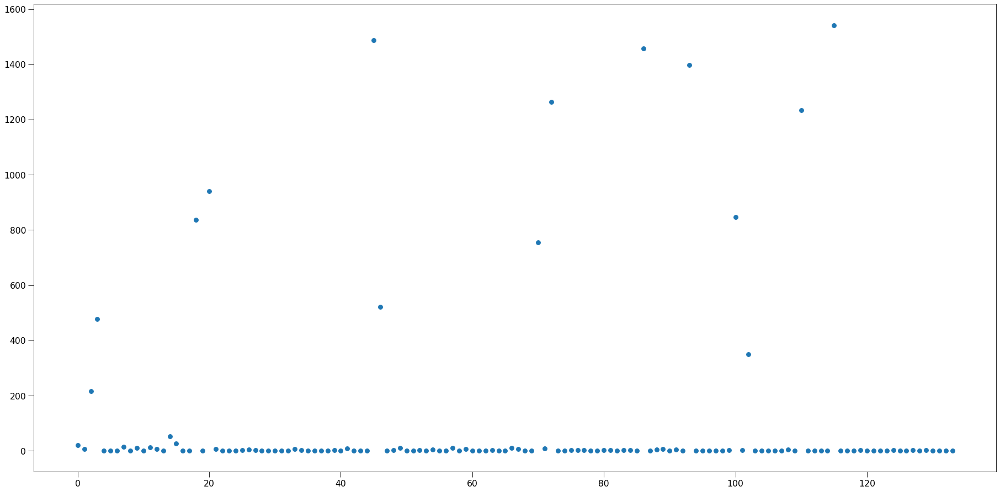

In [8]:
plt.plot(lens)
# plt.ylim(0,5)
np.median(lens)

In [9]:
np.sum(np.array(lens)==1)

77

In [10]:
# calculate the UMAP embedding. In the plots replace position with embedding

pca_100d = PCA(n_components=50).fit_transform(position)

reducer = umap.UMAP(min_dist=0.8)
# scaled_data = StandardScaler().fit_transform(position)
scaled_data = position
embedding = reducer.fit_transform(pca_100d)

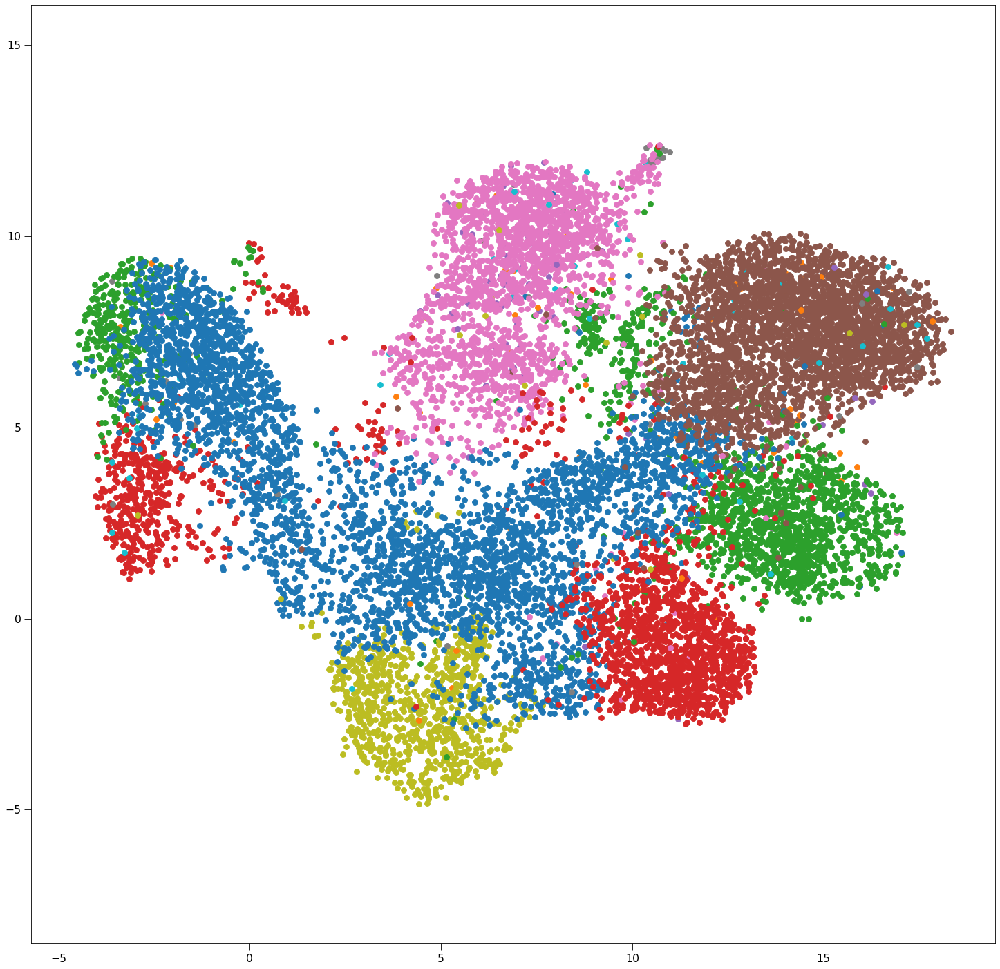

In [13]:
fig, ax = plt.subplots(1, figsize=(24,24))
for label in unique_labels:
    plt.plot(*embedding[np.argwhere(labels == label).T[0]].T, label=label)
ax.axis("equal")
# plt.legend()
plt.show()

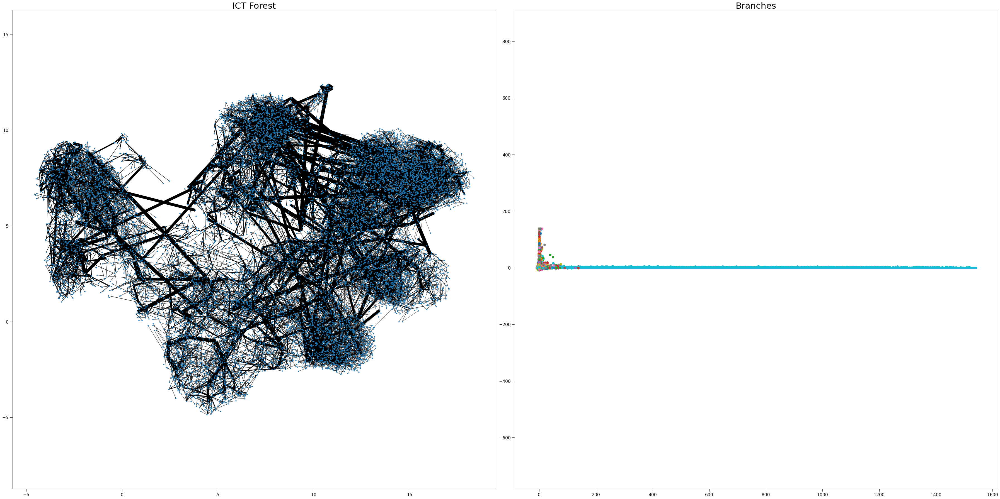

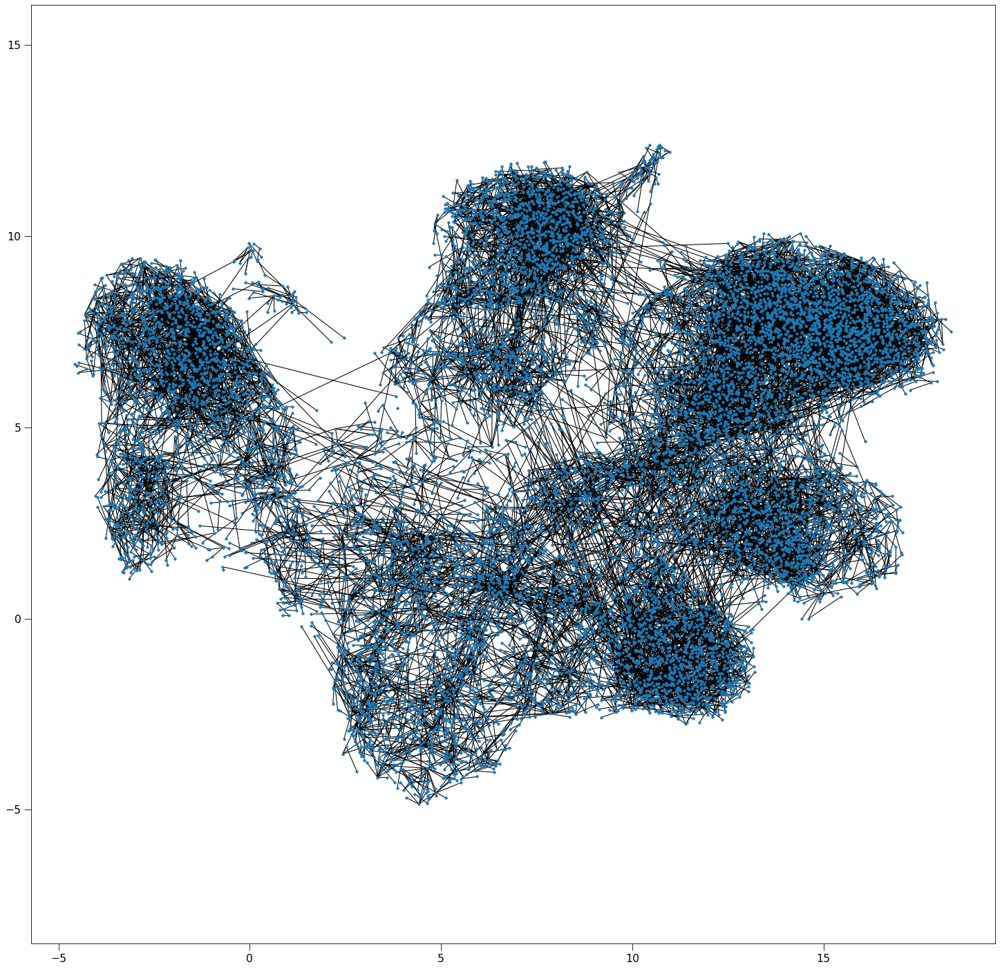

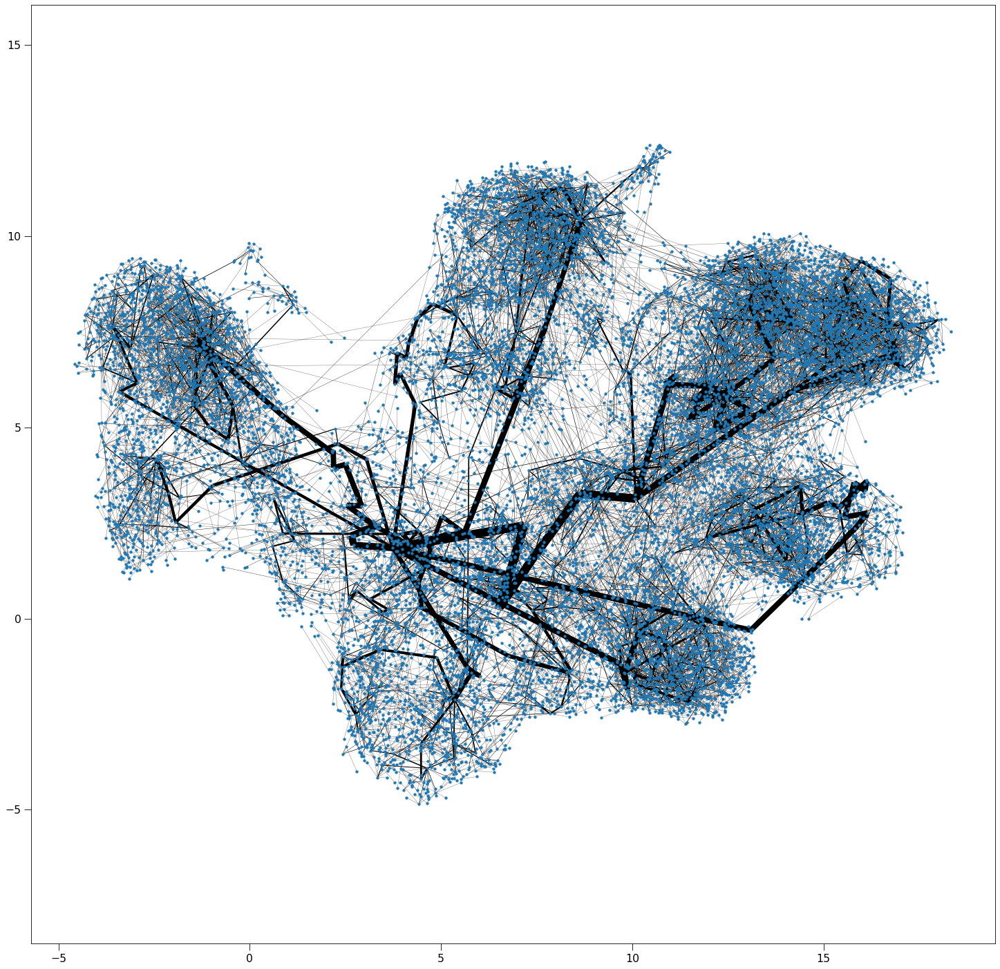

In [15]:
graphs = sub_ICTs
widths = []
for sub_ICT in sub_ICTs:
    if sub_ICT.numberOfNodes() == 1:
        widths.append([])
        continue
    widths.append(compute_widths(sub_ICT))
    
names = ["ICT Forest", "Branches"]

number_of_plots = 2
fig, ax = plt.subplots(1,2, figsize=(24*2,24))

for i, component in enumerate(components):
    nk.viztasks.drawGraph(graphs[i], pos=embedding[component], ax=ax[0], width=widths[i], node_size=10)
            

for component in components:
    ax[1].plot(*position[component].T)
    
for i, name in enumerate(names):
    ax[i].set_title(name)
    ax[i].axis("equal")
    ax[i].tick_params(left=True, bottom=True, labelleft=True, labelbottom=True)
    ax[i].set_axis_on()
    
    
plt.tight_layout()
plt.show()

from sklearn.metrics import pairwise_distances

G = nk.graph.Graph(n=len(position), weighted=True)

distances = pairwise_distances(position, position)

for component, sub_ICT in zip(components, sub_ICTs):
    for u, v, w in sub_ICT.iterEdgesWeights():
        nodeA = component[u]
        nodeB = component[v]
        G.addEdge(nodeA, nodeB, distances[nodeA, nodeB])
        
# plot the not connected graph
fig, ax = plt.subplots(1, figsize=(24,24))
nk.viztasks.drawGraph(G, pos=embedding, ax=ax, node_size=10)
ax.tick_params(left=True, bottom=True, labelleft=True, labelbottom=True)
ax.set_axis_on()
ax.axis("equal")
plt.show()

G = patch_together_nearest(G, position)
G.indexEdges()

# plot the connected graph
fig, ax = plt.subplots(1, figsize=(24,24))
nk.viztasks.drawGraph(G, pos=embedding, ax=ax, width=compute_widths(G), node_size=10)
ax.tick_params(left=True, bottom=True, labelleft=True, labelbottom=True)
ax.set_axis_on()
ax.axis("equal")
plt.show()

## Cluster ICT

In [16]:
# calculate the cluster ICT with all aim nodes
start = time.time()
ICT_cluster_all = calculate_ICT(G, algorithm_type="cluster_all", cluster_centers=cluster_centers,
                                zeros_stay_zeros=True, update_G=1.1)
ICT_cluster_all.indexEdges()

# widths of the edges
widths_cluster_all = compute_widths(ICT_cluster_all)
print(time.time()-start)

update Arr 13706 -> 13706
added 8910 edges early
added 4795 edges early

3.8573594093322754


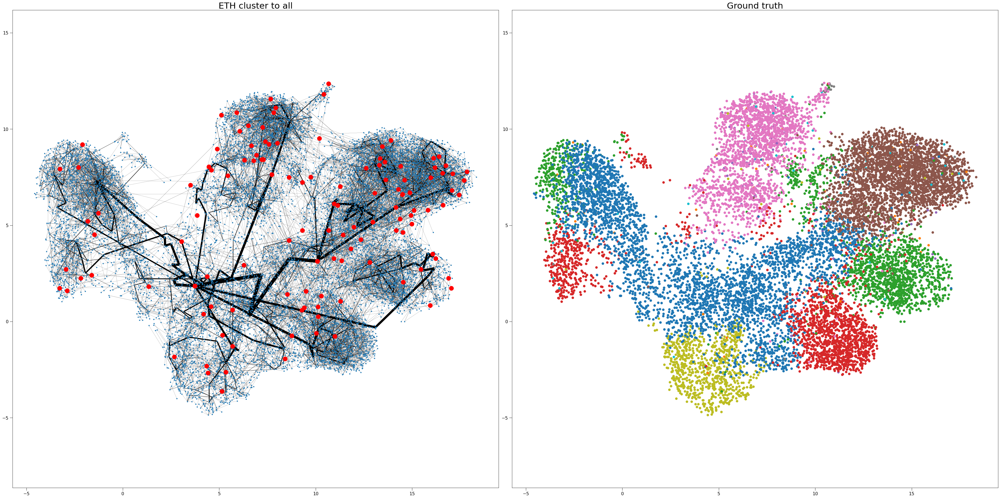

In [17]:
# plotting
graphs = [ICT_cluster_all]
widths = [np.array(widths_cluster_all)]
names = ["ETH cluster to all", "Ground truth"]


number_of_plots = len(names)
fig, ax = plt.subplots(1,2, figsize=(24*2,24))

if number_of_plots == 1:
    ax = [ax]
    
for i in range(number_of_plots):
    if i == 0:
        nk.viztasks.drawGraph(graphs[i], pos=embedding, ax=ax[i], width=widths[i], node_size=10)
        ax[i].tick_params(left=True, bottom=True, labelleft=True, labelbottom=True)
        ax[i].plot(*embedding[cluster_centers].T, marker="o", color = "Red")
        ax[i].set_axis_on()
    else:
        for label in unique_labels:
            plt.plot(*embedding[np.argwhere(labels == label).T[0]].T, label=label)
    ax[i].set_title(names[i])
    ax[i].axis("equal")
    
plt.tight_layout()
plt.savefig("./Output/Images/ETH-connect-to-nearest")
plt.show()

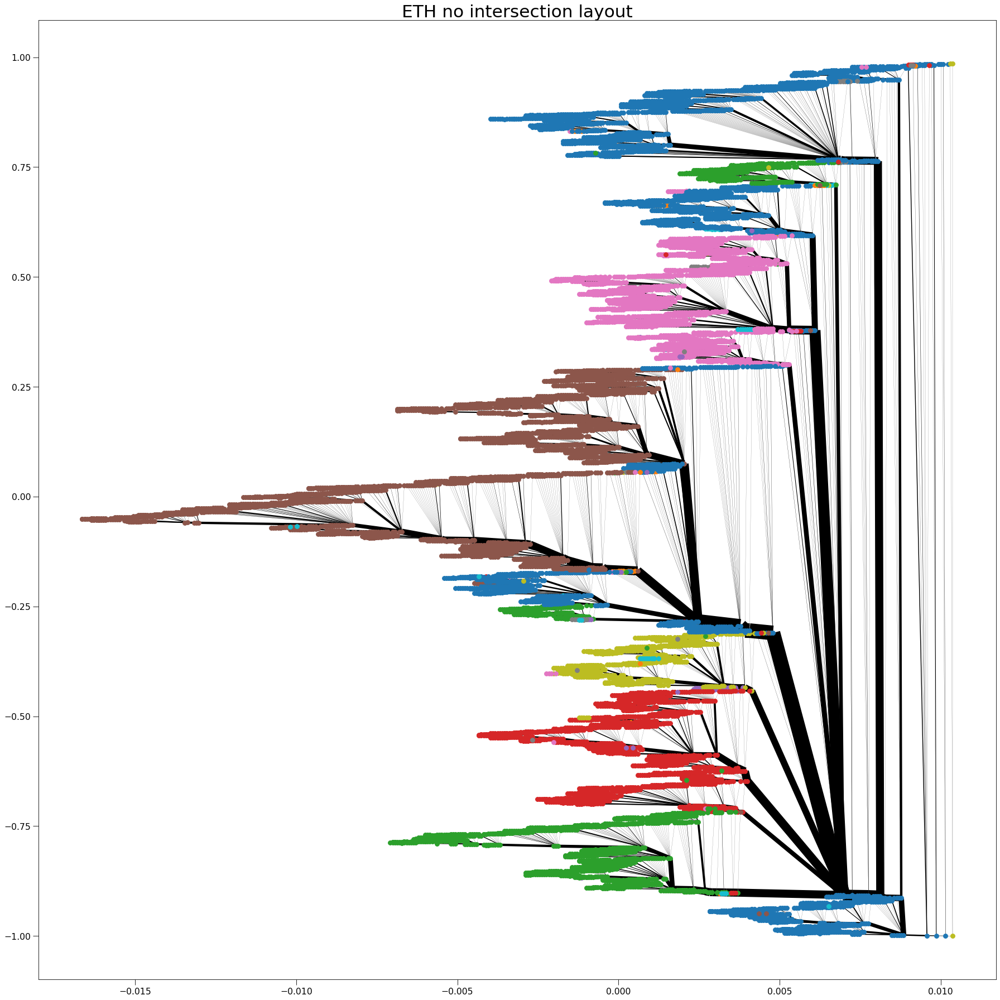

In [18]:
import networkx as nx
from copy import deepcopy
from numpy.linalg import norm
ICT = deepcopy(ICT_cluster_all)

for u, v in ICT.iterEdges():
    ICT.setWeight(u, v, norm(position[u] - position[v]))
    
ICT_nx = nk.nxadapter.nk2nx(ICT)

def arr_to_dict(arr):
    dct = {}
    for idx, elem in tqdm(enumerate(arr), desc="Create a dict from the position array"):
        dct[idx] = elem
    return dct

mapping = nx.planar_layout(ICT_nx)

mapping_ndarray = np.zeros((ICT.upperEdgeIdBound()+1,2))

# print(mapping_ndarray)

for key, val in zip(mapping.keys(), mapping.values()):
#     print(key)
    mapping_ndarray[key] = np.array([-val[1], -val[0]])
    
mapping = mapping_ndarray

# plotting
graphs = [ICT_cluster_all]
widths = [widths_cluster_all]
names = ["ETH no intersection layout", "Empty dataset"]


number_of_plots = 1
fig, ax = plt.subplots(1,1, figsize=(24,24))

if number_of_plots == 1:
    ax = [ax]
    
for i in range(number_of_plots):
    if i == 0:
        nk.viztasks.drawGraph(graphs[i], pos=mapping, ax=ax[i], width=np.array(widths[i])**1.3, node_size=0)
        ax[i].tick_params(left=True, bottom=True, labelleft=True, labelbottom=True)
#         ax[i].plot(*mapping[cluster_centers].T, marker="o", color = "Red")
        ax[i].set_axis_on()
        for label in unique_labels:
            plt.plot(*mapping[np.argwhere(labels == label).T[0]].T, label=label)
    ax[i].set_title(names[i])
#     ax[i].axis("equal")
    
plt.tight_layout()
plt.savefig("./Output/Images/ETH-connect-to-nearest-no-intersections")
plt.show()

# DTAE embedding

In [19]:
DTAE_embedding = pd.read_csv("~/Data/eth/embedding.csv",header=None)

DTAE_embedding = DTAE_embedding.to_numpy()

DTAE_embedding = DTAE_embedding[CA_to_CC]

In [20]:
DTAE_embedding.shape

(13707, 2)

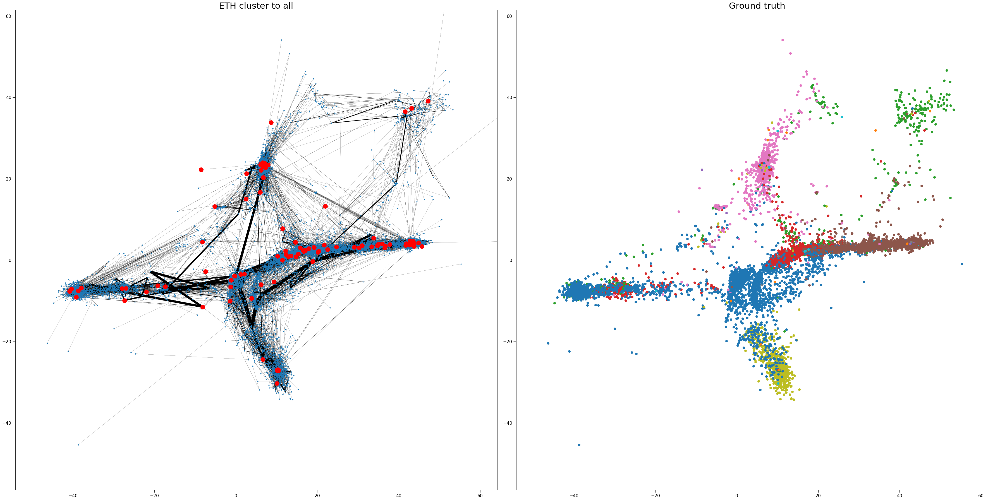

In [21]:
# plotting
graphs = [ICT_cluster_all]
widths = [np.array(widths_cluster_all)]
names = ["ETH cluster to all", "Ground truth"]


number_of_plots = len(names)
fig, ax = plt.subplots(1,2, figsize=(24*2,24))

if number_of_plots == 1:
    ax = [ax]
    
for i in range(number_of_plots):
    if i == 0:
        nk.viztasks.drawGraph(graphs[i], pos=DTAE_embedding, ax=ax[i], width=widths[i], node_size=10)
        ax[i].tick_params(left=True, bottom=True, labelleft=True, labelbottom=True)
        ax[i].plot(*DTAE_embedding[cluster_centers].T, marker="o", color = "Red")
        ax[i].set_axis_on()
    else:
        for label in unique_labels:
            plt.plot(*DTAE_embedding[np.argwhere(labels == label).T[0]].T, label=label)
    ax[i].set_title(names[i])
    ax[i].axis("equal")
    ax[i].set_xlim([-50,60])
    ax[i].set_ylim([-45,50])
    
plt.tight_layout()
plt.savefig("./Output/Images/ETH-connect-to-nearest-dtae-layout")
plt.show()